<a href="https://colab.research.google.com/github/01hanan/Graduation-Project-II-SALIK-SYSTEM-/blob/main/YOLOv8_Model_Training__.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **YOLOv8 Model Training**


**Display information about NVIDIA GPUs**
> including their utilization, memory usage, temperature, and processes, within compatible environments.



In [ ]:
!nvidia-smi

Wed Oct 11 13:29:59 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

**Install a specific version (8.0.194) of the Ultralytics**

In [ ]:
!pip install ultralytics==8.0.194

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 617.4/617.4 kB 8.4 MB/s eta 0:00:00


**Import the YOLO class from the Ultralytics library**, the os module, and display-related functions from IPython, and then clears the output display.

In [ ]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()

In [ ]:
!yolo mode=checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 394, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are ('train', 'val', 'predict', 'export', 'track', 'benchmark').

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of ('detect', 'segment', 'classify', 'pose')
                MODE (required) is one of ('train', 'val', 'predict', 'export', 'track', 'benchmark')
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at https://d

**Install the "roboflow" package and install the project dataset**,
>  imports the Roboflow class from the "roboflow" package, and then initializes and downloads our "yolov8" dataset using the Roboflow API with provided authentication.



In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="TbK8KumtqwQU1hysK5eT")
project = rf.workspace("salik-system").project("salikv3")
dataset = project.version(1).download("yolov8")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 21.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.0/69.0 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.5 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninstalled 

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.194, to fix: `pip install ultralytics==8.0.134`



Extracting Dataset Version Zip to SALIKv3-1 in yolov8:: 100%|██████████| 6300/6300 [00:01<00:00, 5354.59it/s]


**Training the model with specific parameters with 70 epochs, and 512 image size.**

In [ ]:
!yolo task=detect mode=train model=yolov8l.pt data=/content/SALIKv3-1/data.yaml epochs=70 imgsz=512

100% 83.7M/83.7M [00:00<00:00, 358MB/s]
New https://pypi.org/project/ultralytics/8.0.196 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.194 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=/content/SALIKv3-1/data.yaml, epochs=70, patience=50, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_widt

**Display confusion matrix**

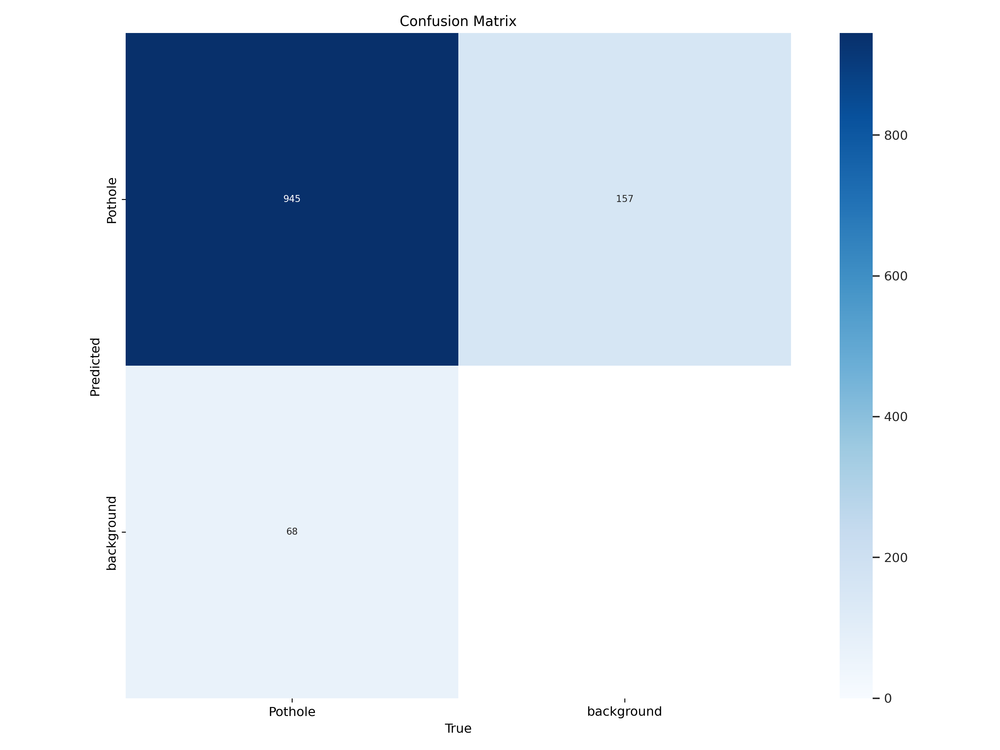

In [ ]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)

**Display training results**



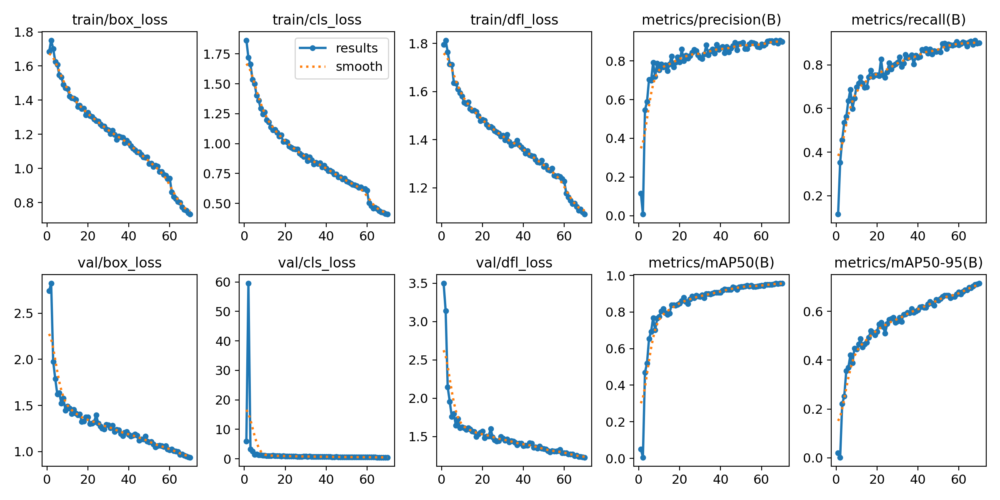

In [ ]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)

**Display F1-Confidence Curve**

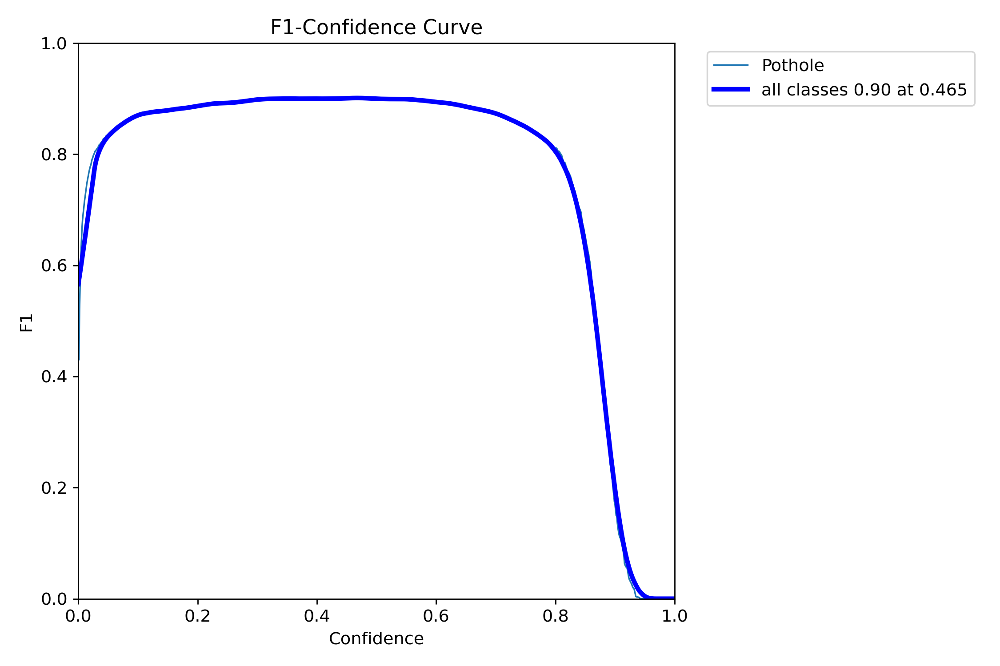

In [ ]:
Image(filename=f'/content/runs/detect/train/F1_curve.png', width=600)

**Display Precision-Recall Curve**

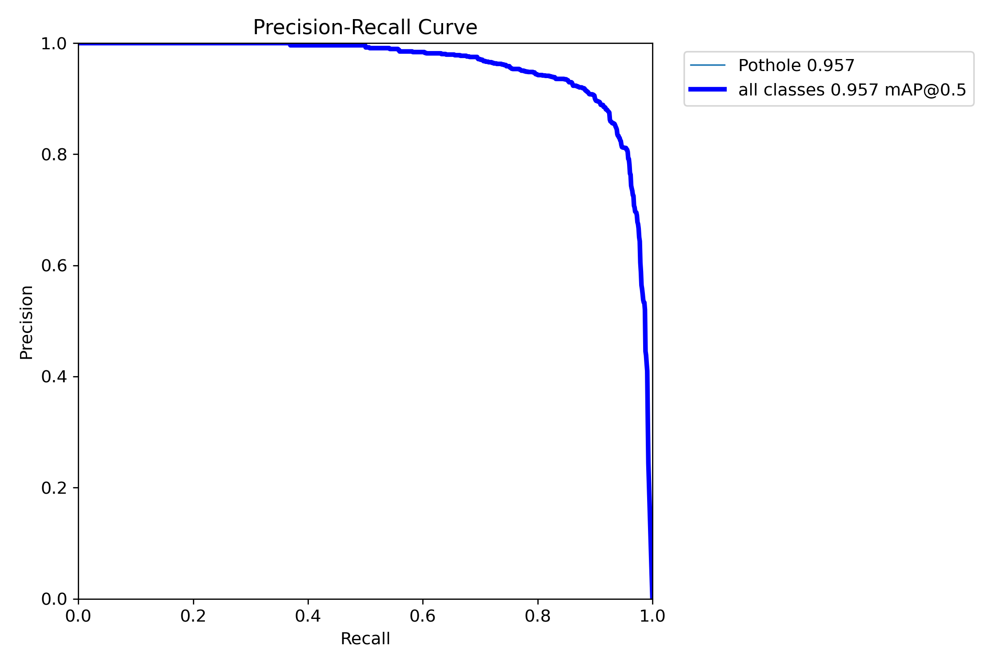

In [ ]:
Image(filename=f'/content/runs/detect/train/PR_curve.png', width=600)

**Display Percision-Confidence Curve**

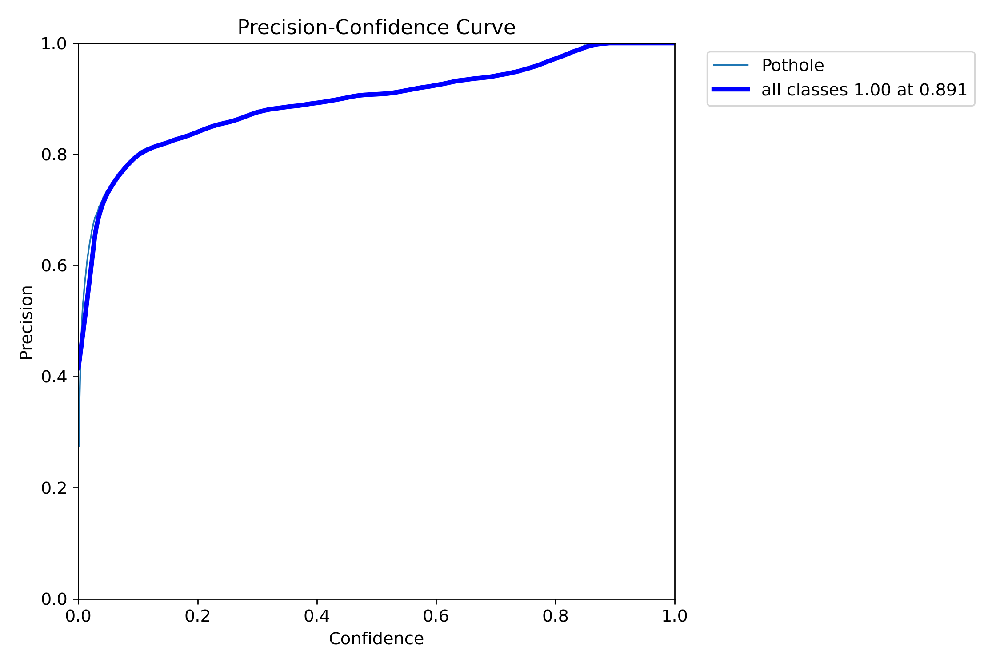

In [ ]:
Image(filename=f'/content/runs/detect/train/P_curve.png', width=600)

**Display Recall-Confidence Curve**

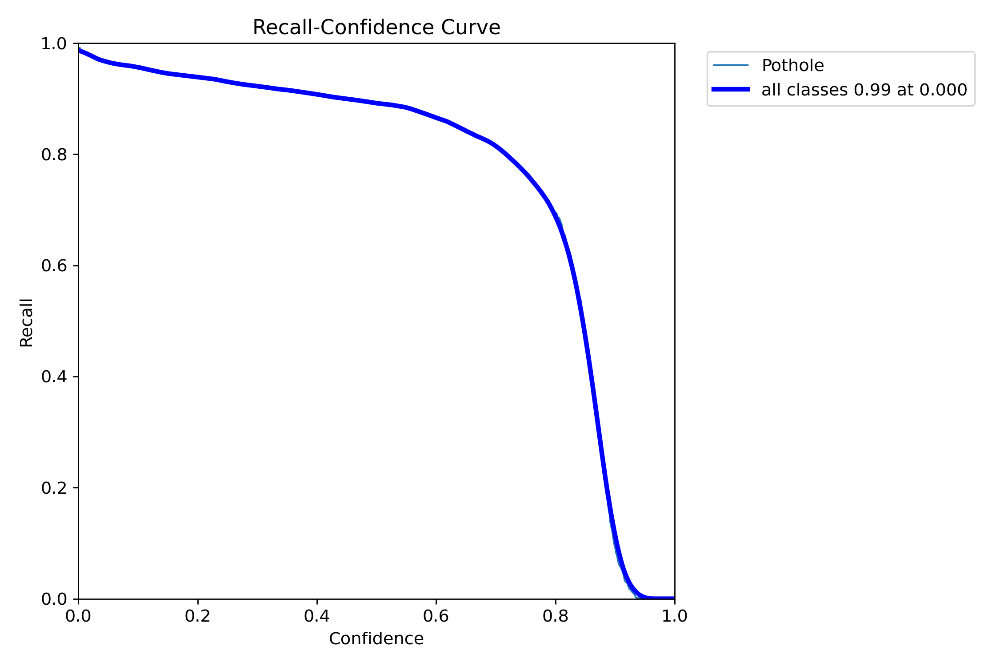

In [ ]:
Image(filename=f'/content/runs/detect/train/R_curve.png', width=600)

**Display Normalized Confusion Matrix**

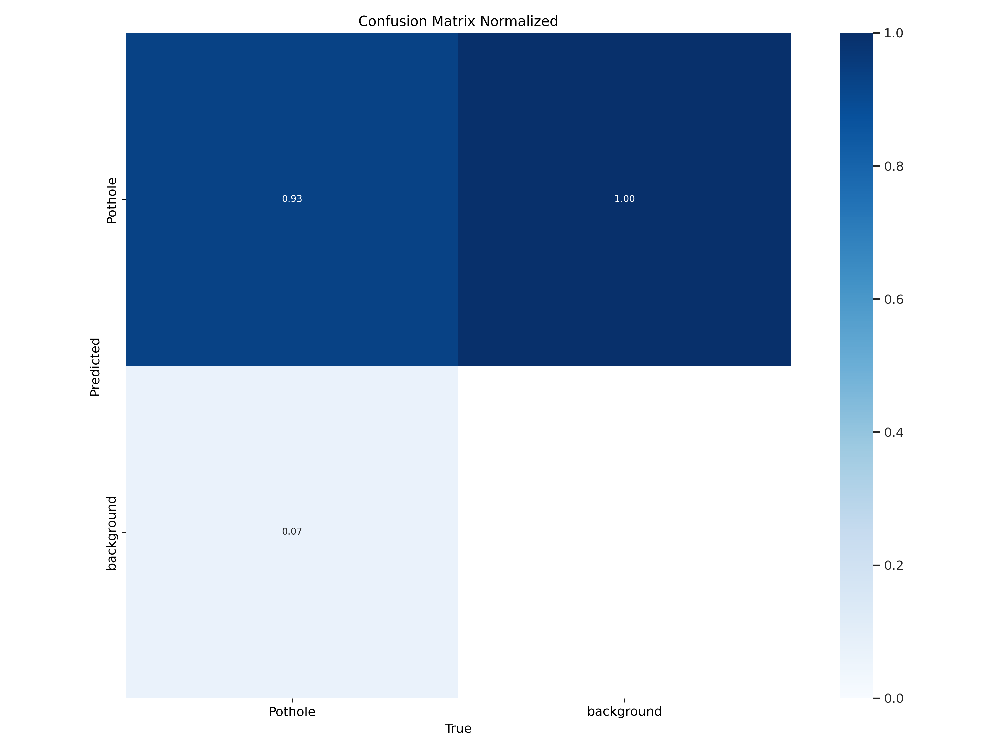

In [ ]:
Image(filename=f'/content/runs/detect/train/confusion_matrix_normalized.png', width=600)

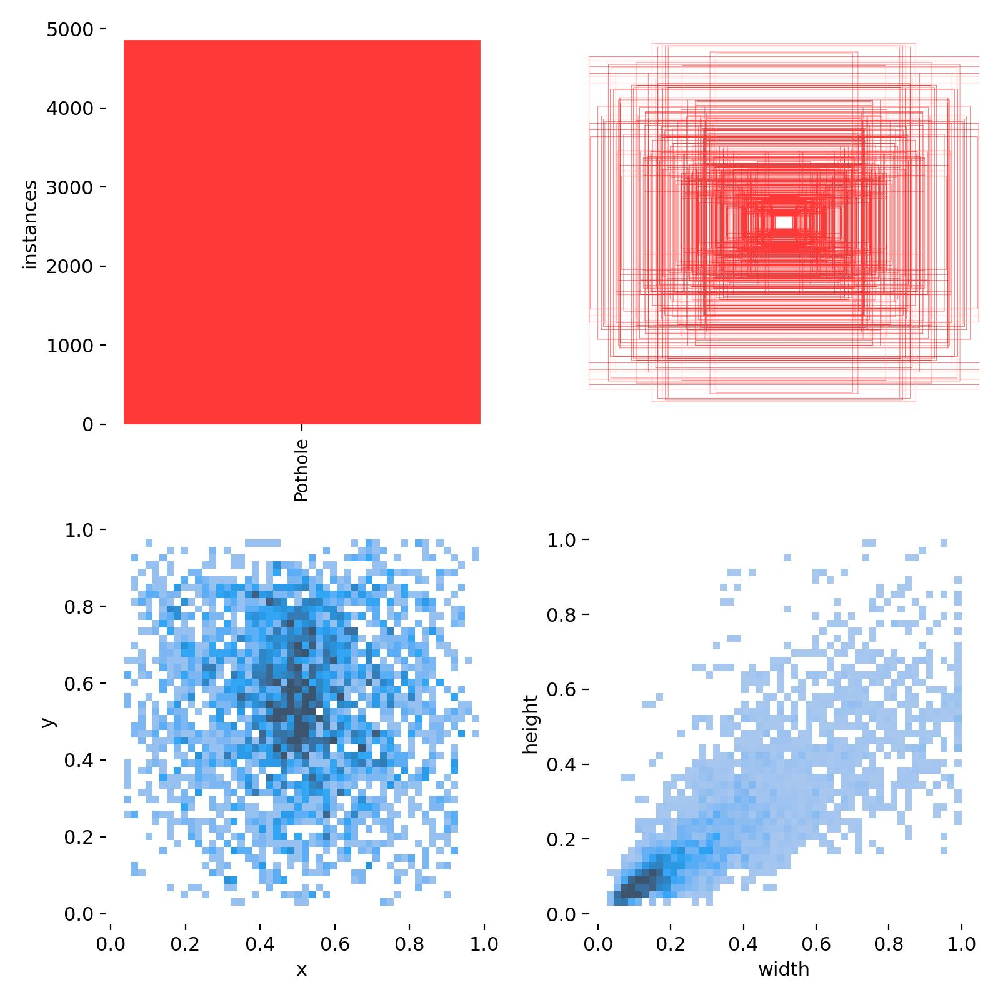

In [ ]:
Image(filename=f'/content/runs/detect/train/labels.jpg', width=600)

**Display Labels Correlogram**

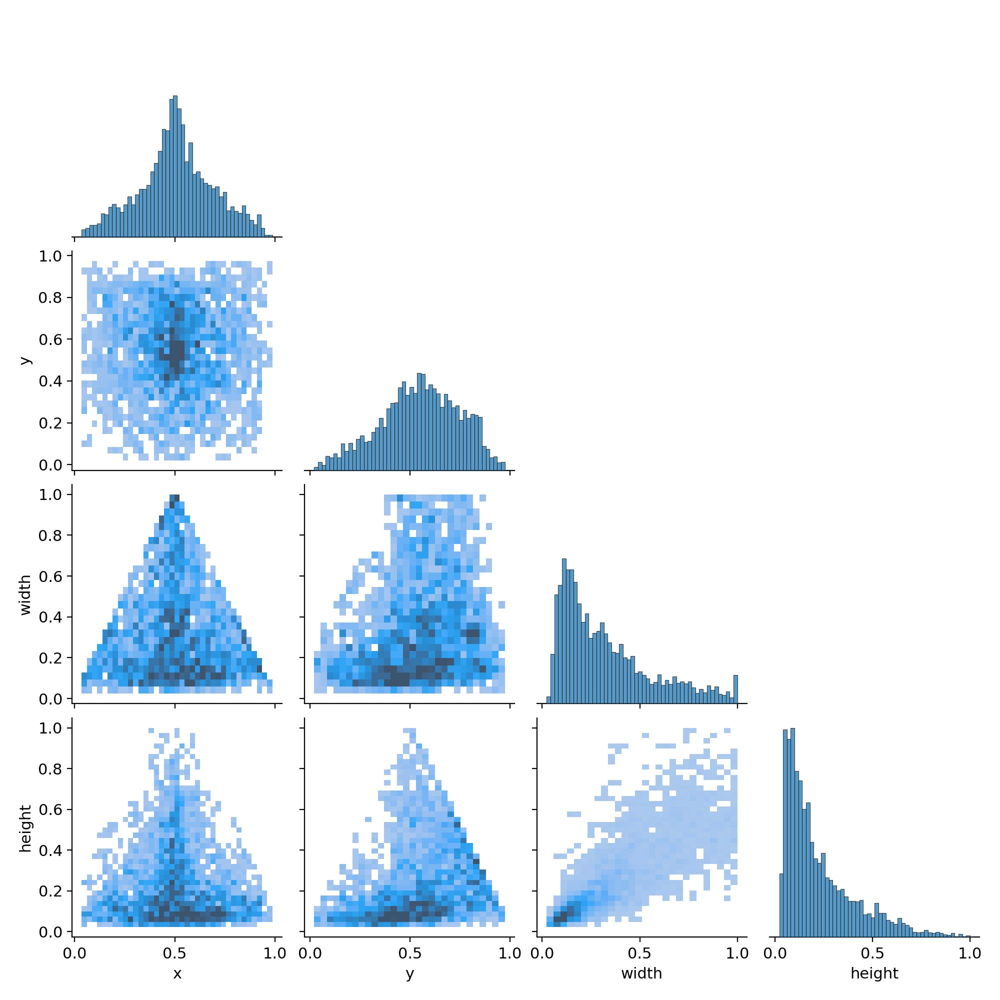

In [ ]:
Image(filename=f'/content/runs/detect/train/labels_correlogram.jpg', width=600)

**Display Train Batch0, Batch1, and Batch2**

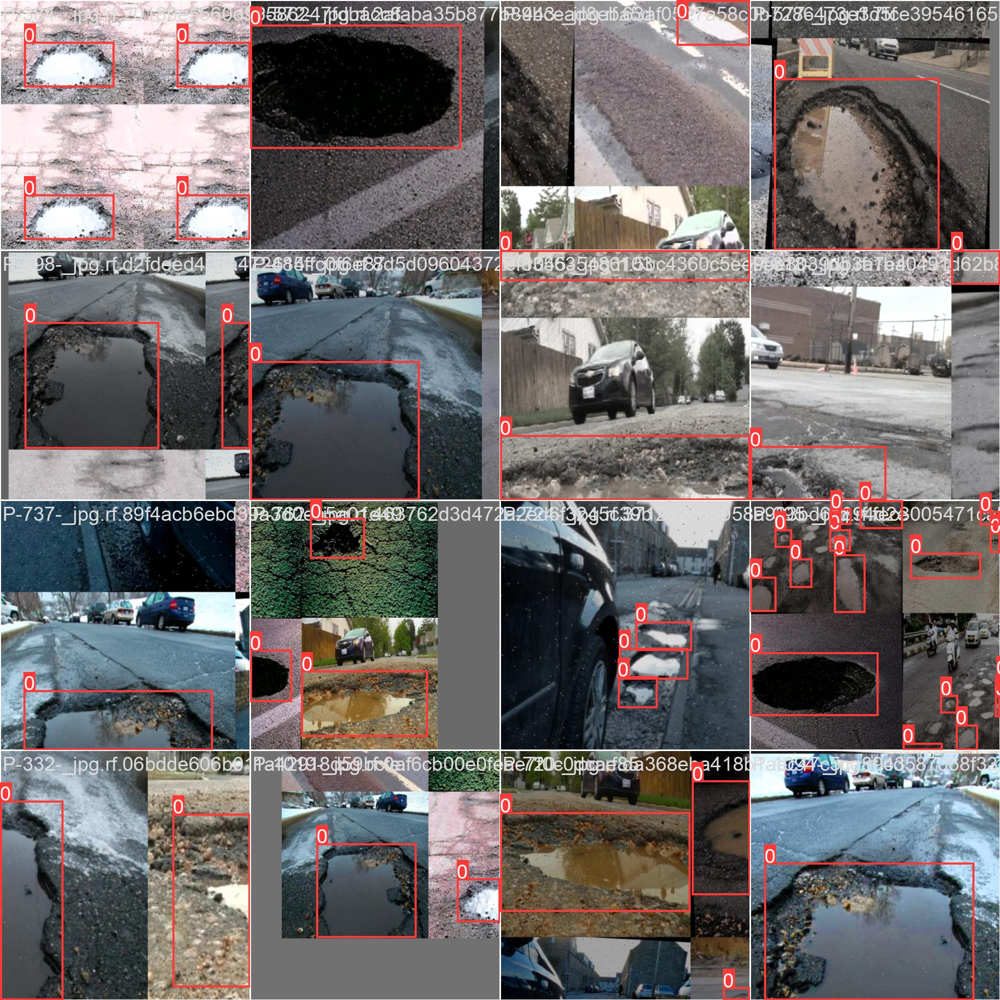

In [ ]:
Image(filename=f'/content/runs/detect/train/train_batch0.jpg', width=600)

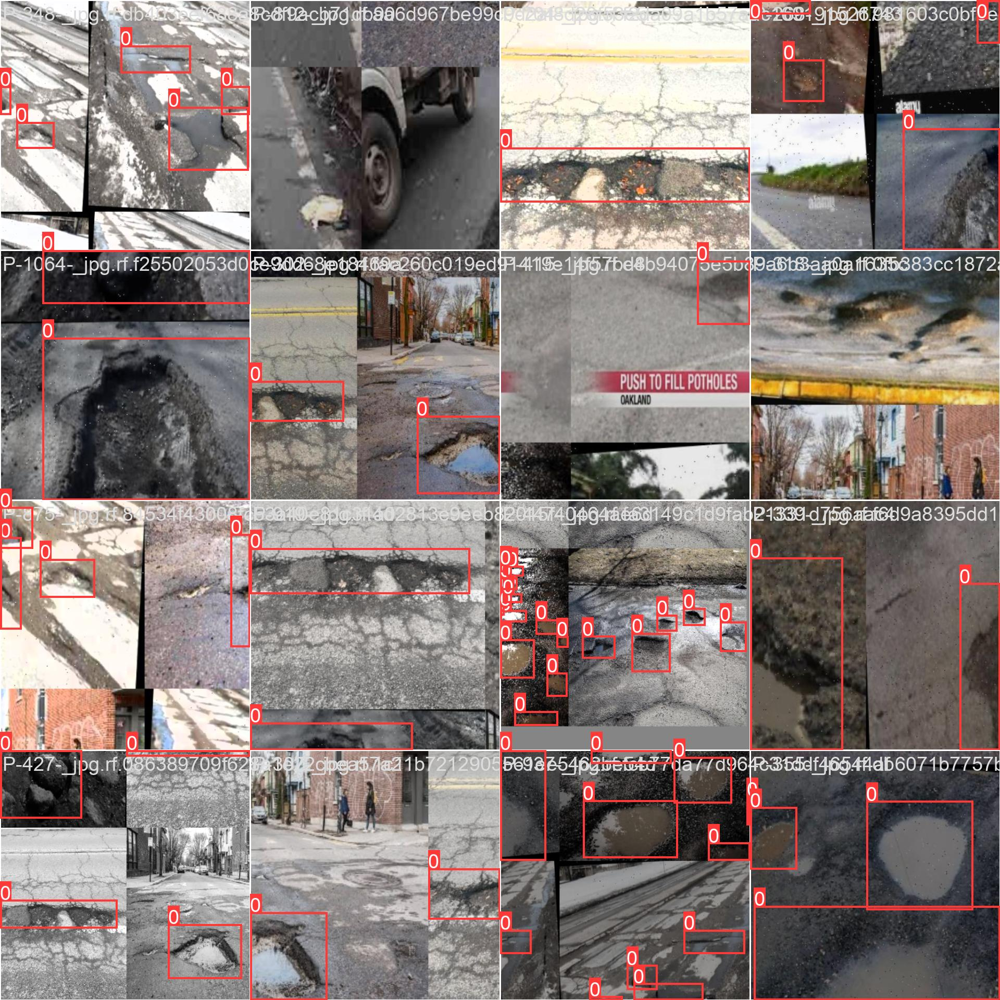

In [ ]:
Image(filename=f'/content/runs/detect/train/train_batch1.jpg', width=600)

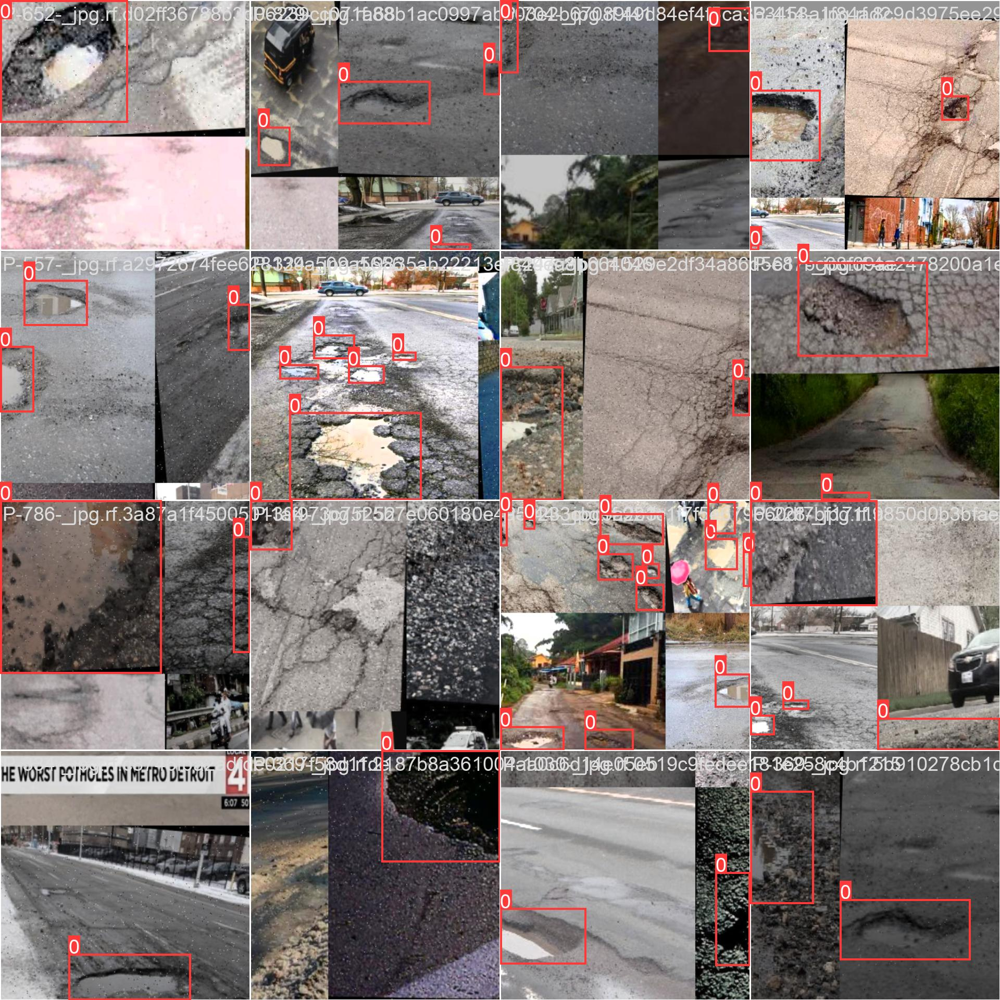

In [ ]:
Image(filename=f'/content/runs/detect/train/train_batch2.jpg', width=600)

**Display Train Batch8280, Batch8281, and Batch8282**

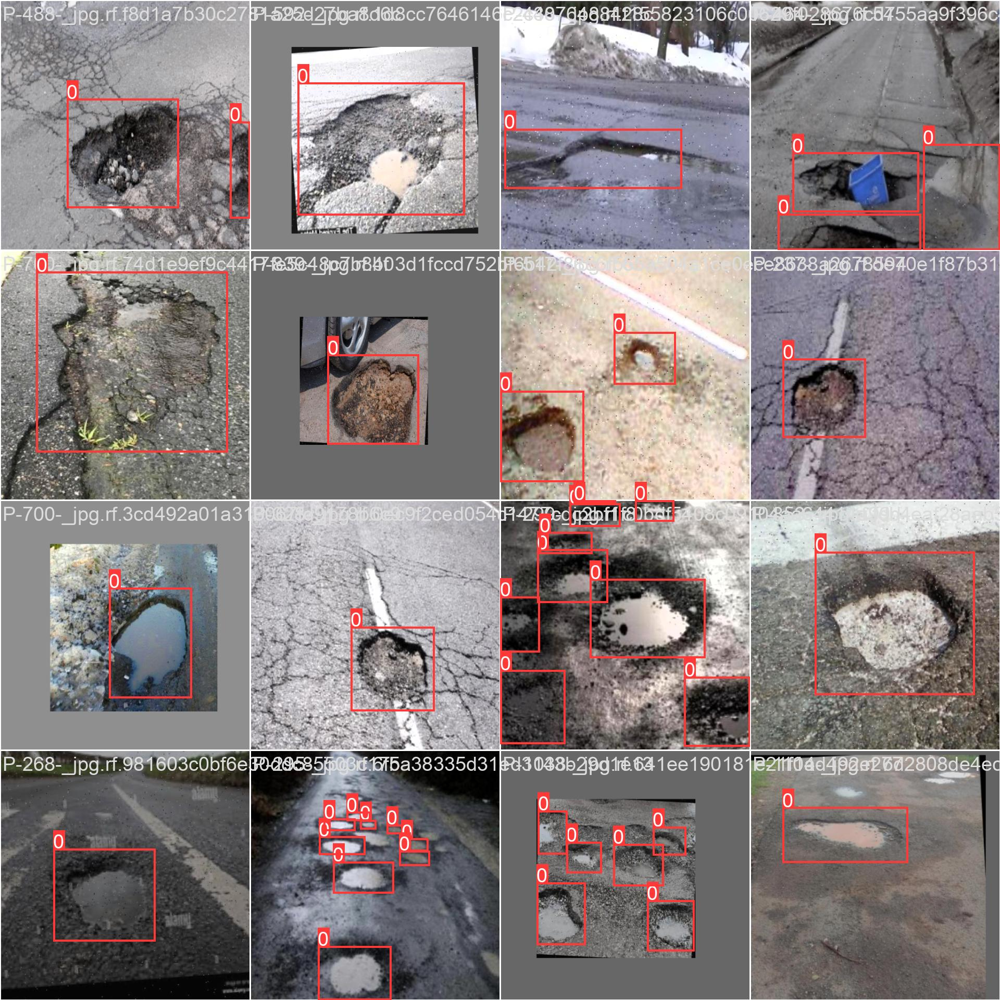

In [ ]:
Image(filename=f'/content/runs/detect/train/train_batch8280.jpg', width=600)

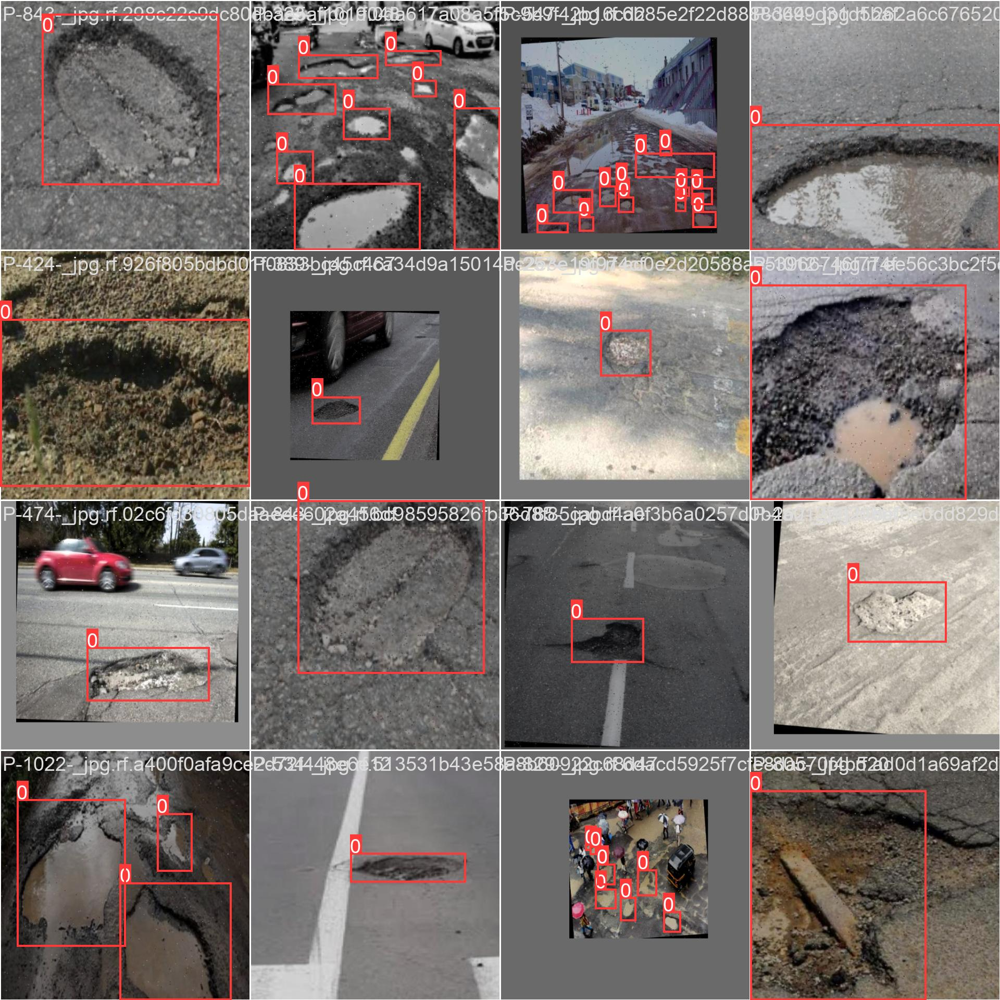

In [ ]:
Image(filename=f'/content/runs/detect/train/train_batch8281.jpg', width=600)

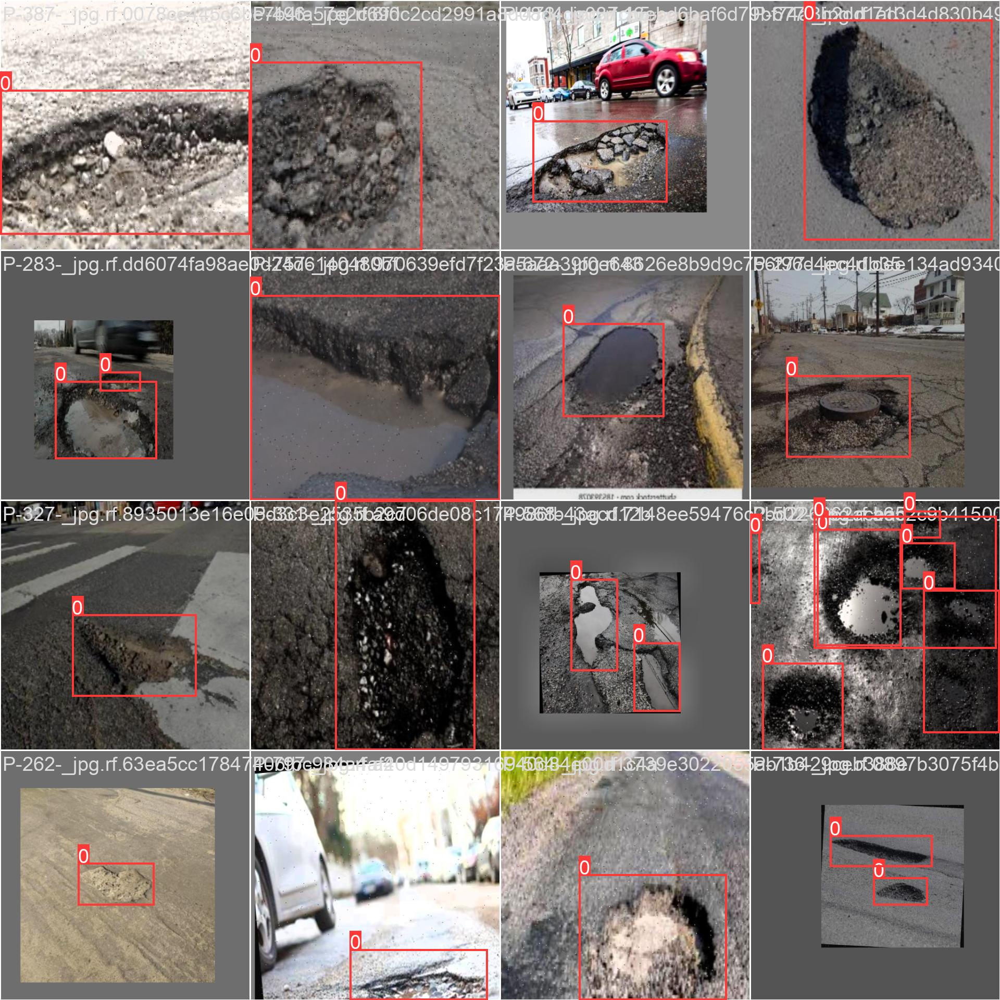

In [ ]:
Image(filename=f'/content/runs/detect/train/train_batch8282.jpg', width=600)

**Display Val Batch0 with labels**

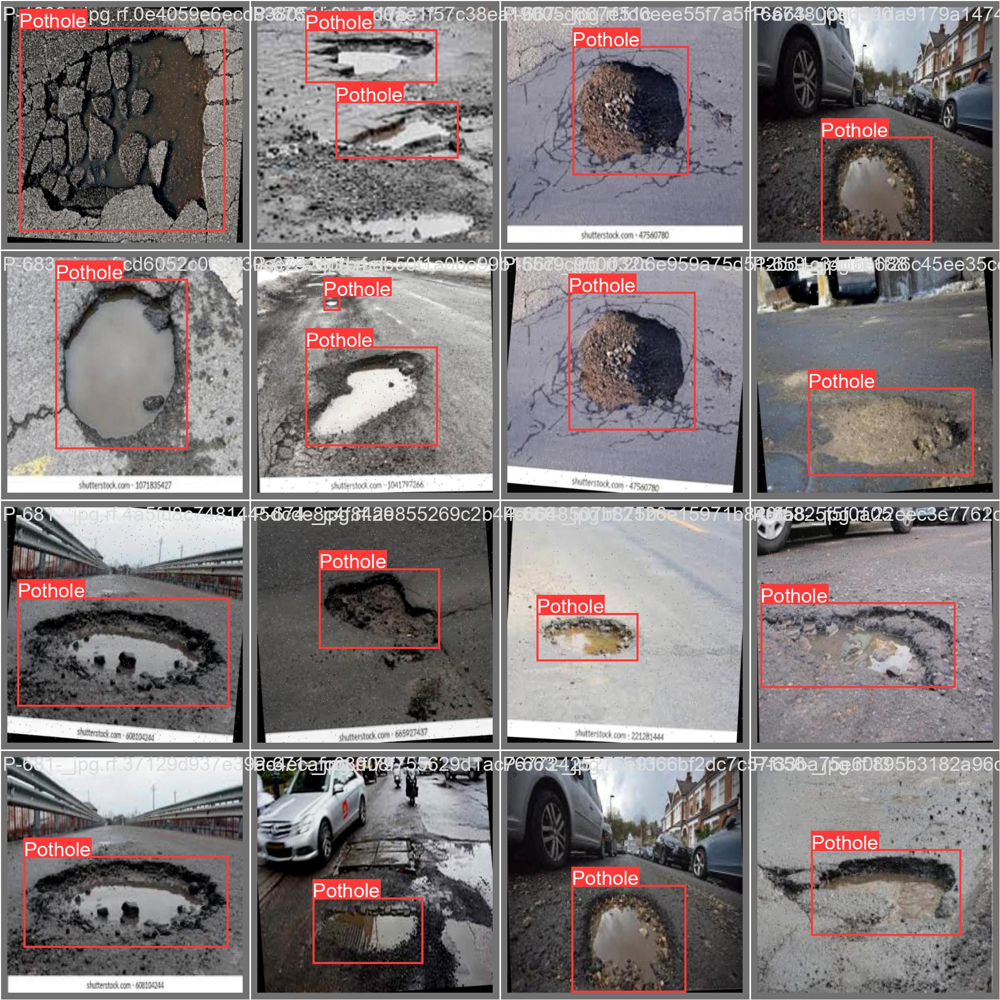

In [ ]:
Image(filename=f'/content/runs/detect/train/val_batch0_labels.jpg', width=600)

**Display Val Batch0 with predection**

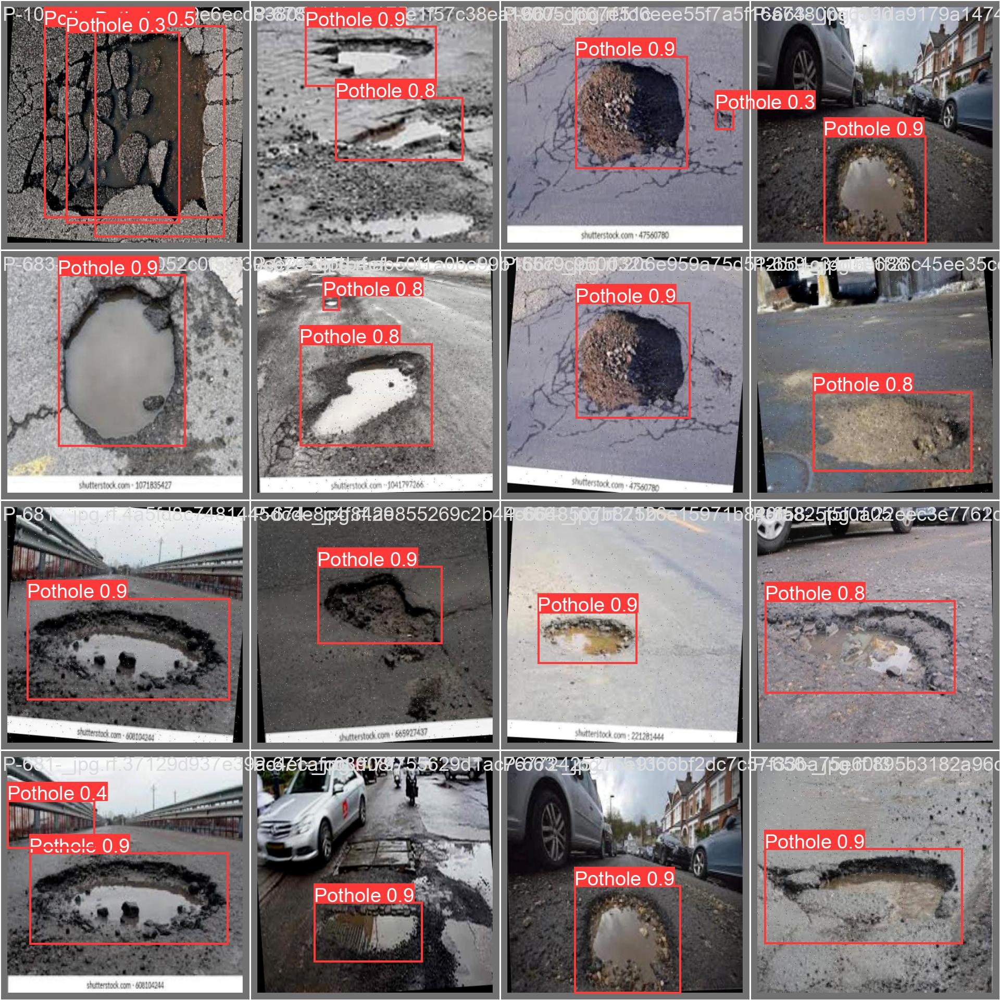

In [ ]:
Image(filename=f'/content/runs/detect/train/val_batch0_pred.jpg', width=600)

**Display Val Batch1 with labels**

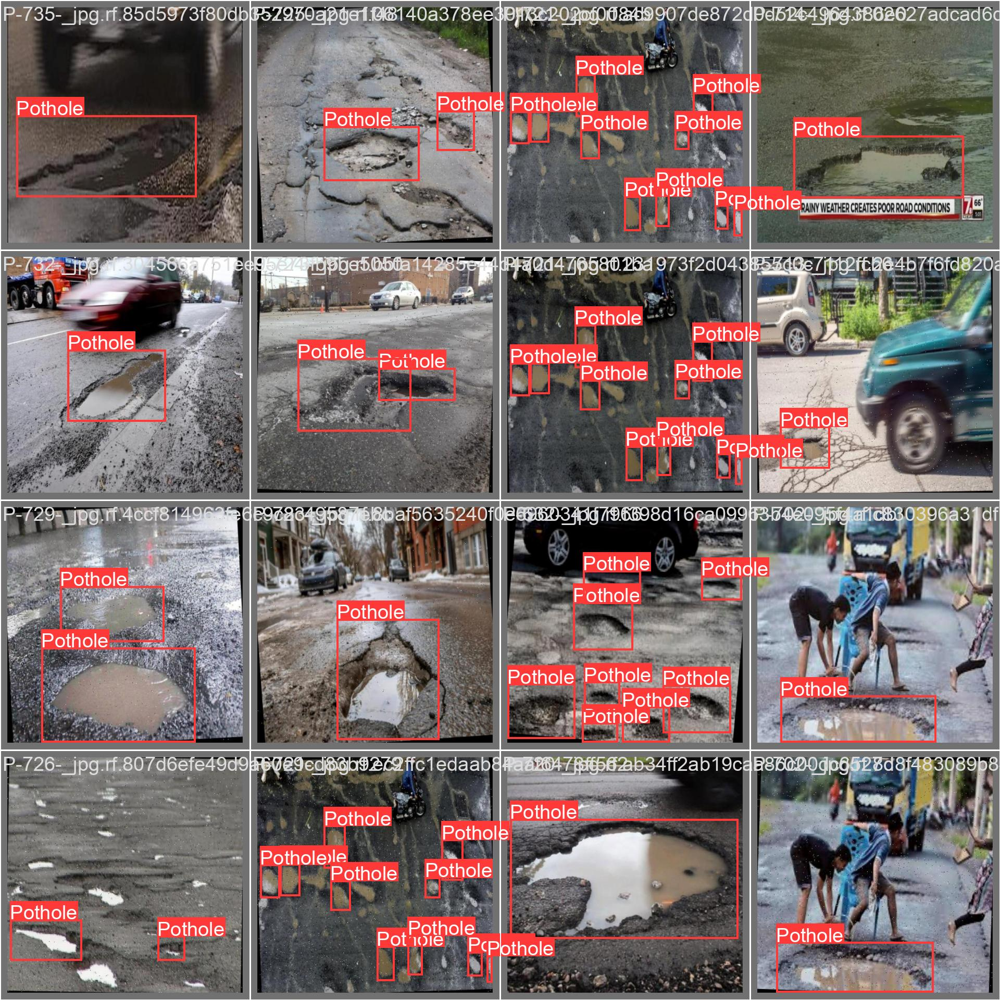

In [ ]:
Image(filename=f'/content/runs/detect/train/val_batch1_labels.jpg', width=600)

**Display Val Batch1 with predection**

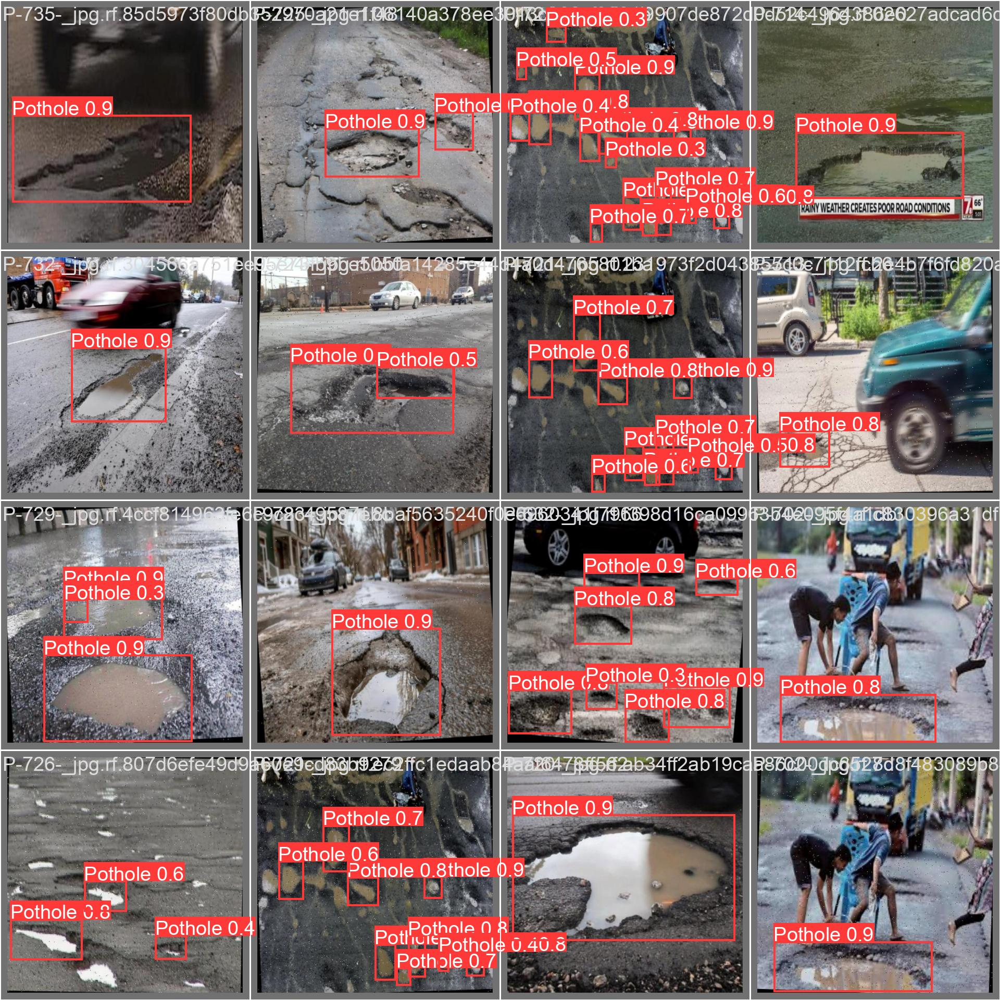

In [ ]:
Image(filename=f'/content/runs/detect/train/val_batch1_pred.jpg', width=600)

**Display Val Batch2 with labels**

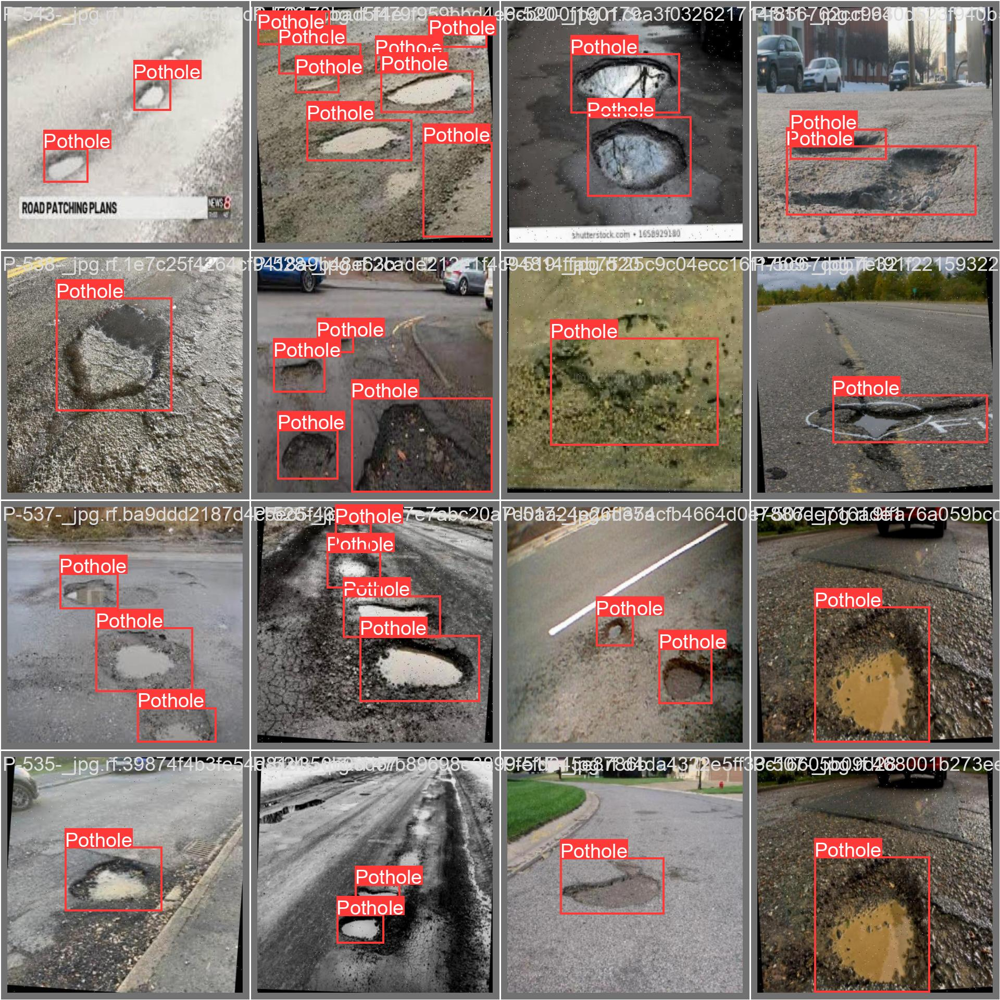

In [ ]:
Image(filename=f'/content/runs/detect/train/val_batch2_labels.jpg', width=600)

**Display Val Batch2 with predection**

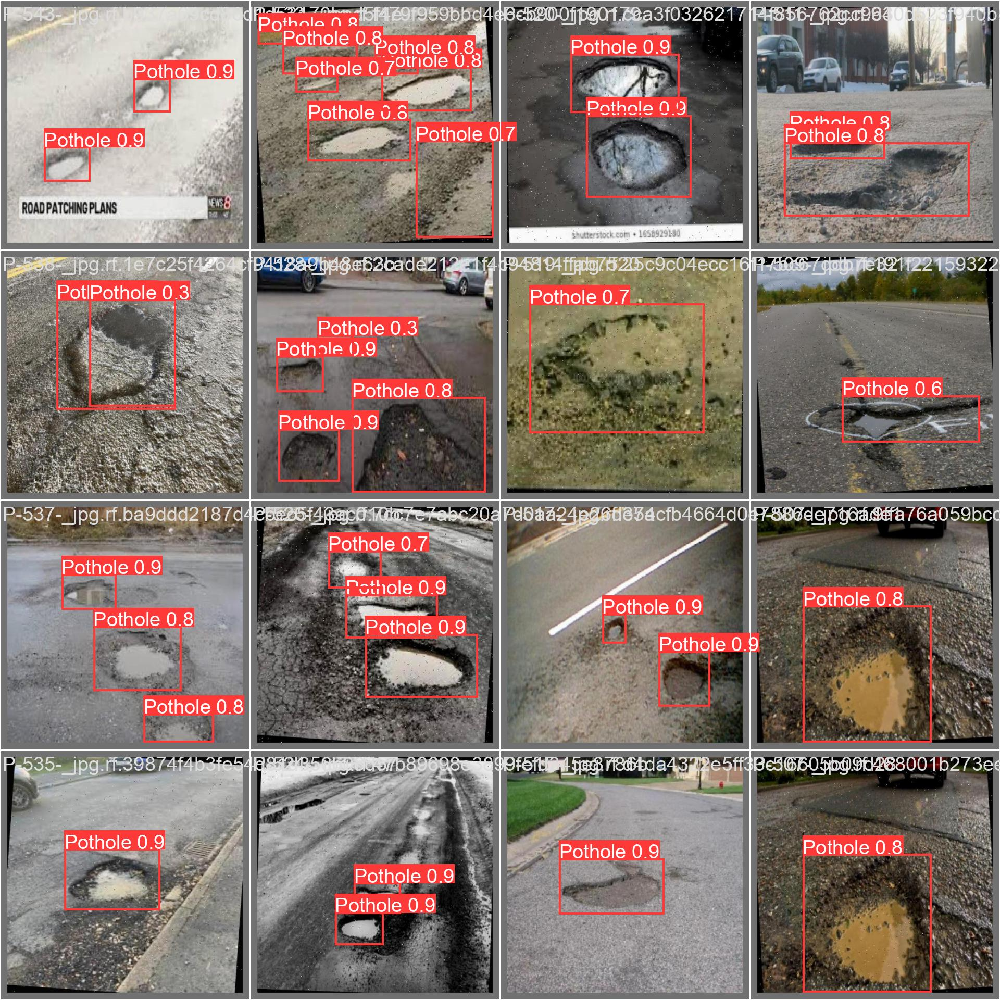

In [ ]:
Image(filename=f'/content/runs/detect/train/val_batch2_pred.jpg', width=600)

**Evaluates the model on the validation dataset**

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data=/content/SALIKv3-1/data.yaml

Ultralytics YOLOv8.0.194 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs
val: Scanning /content/SALIKv3-1/valid/labels.cache... 471 images, 0 backgrounds, 0 corrupt: 100% 471/471 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 30/30 [00:15<00:00,  1.99it/s]
                   all        471       1013        0.9        0.9      0.957      0.714
Speed: 0.6ms preprocess, 23.0ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/val2
💡 Learn more at https://docs.ultralytics.com/modes/val


**Utilizes the model to make predictions on images from a test dataset with a confidence threshold of 0.45, and saves the results.**

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf= 0.45 source={dataset.location}/test/images save=True

Ultralytics YOLOv8.0.194 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs

image 1/472 /content/SALIKv3-1/test/images/P-1000-_jpg.rf.b661d76ebb9eb67aee2f232090915158.jpg: 512x512 2 Potholes, 42.5ms
image 2/472 /content/SALIKv3-1/test/images/P-1001-_jpg.rf.85a9eb03b4908aeaa8337266d1b7bcd8.jpg: 512x512 1 Pothole, 42.6ms
image 3/472 /content/SALIKv3-1/test/images/P-1002-_jpg.rf.c58a13993add54df57df0fbe86c1f810.jpg: 512x512 4 Potholes, 42.4ms
image 4/472 /content/SALIKv3-1/test/images/P-1007-_jpg.rf.e3e3f713afc59aa27d638ad47a94e270.jpg: 512x512 1 Pothole, 28.7ms
image 5/472 /content/SALIKv3-1/test/images/P-1011-_jpg.rf.80c91711ea33e9a6bbdffa040189fef4.jpg: 512x512 2 Potholes, 28.7ms
image 6/472 /content/SALIKv3-1/test/images/P-1012-_jpg.rf.bc7b3b4c97b6679a2a71441820e23f64.jpg: 512x512 1 Pothole, 28.7ms
image 7/472 /content/SALIKv3-1/test/images/P-1014-_jpg.rf.2d27c1bb7f953615463b0bf0c02395fe.jpg

**Iterate through predict image file and displaying each image with a height of 400 pixels.**

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display (Image (filename = image_path, height=400))
  print("\n")